In [1]:
from fastai.vision.all import *

path = Path('military_aircraft/crop/')
searches = 'C5','C17'

/home/andre/.cache/pypoetry/virtualenvs/military-detection-3ZlVuL9_-py3.12/lib/python3.12/site-packages/fastai/learner.py:450: SyntaxWarning: invalid escape sequence '\R'
  e.args = [f"Custom classes or functions exported with your `Learner` not available in namespace.\Re-declare/import before loading:\n\t{e.args[0]}"]


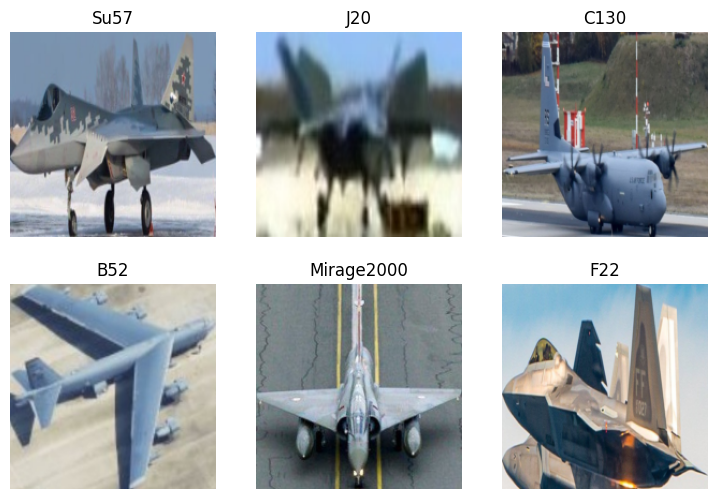

In [2]:
dls = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files, 
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=[Resize(192, method='squish')]
).dataloaders(path, bs=32)

dls.show_batch(max_n=6)

In [3]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(10)

epoch,train_loss,valid_loss,error_rate,time
0,3.031556,2.436905,0.619771,00:19


epoch,train_loss,valid_loss,error_rate,time
0,1.941352,1.572234,0.409142,00:23
1,1.323848,1.179515,0.315135,00:23
2,0.999024,1.028270,0.271685,00:24
3,0.553978,0.966804,0.240672,00:23
4,0.316328,0.967332,0.231627,00:23
5,0.155585,0.946982,0.213374,00:23
6,0.063746,0.895062,0.198352,00:24
7,0.026794,0.860111,0.183169,00:23
8,0.016379,0.833915,0.178646,00:23
9,0.009949,0.833466,0.175901,00:23


In [4]:
is_plane,_,probs = learn.predict(PILImage.create('f18.jpeg'))
print(f"This is a: {is_plane}.")
print(f"Probability : {probs[0]:.4f}")

This is a: Su25.
Probability : 0.0036


In [5]:
img = PILImage.create('f18.jpeg')

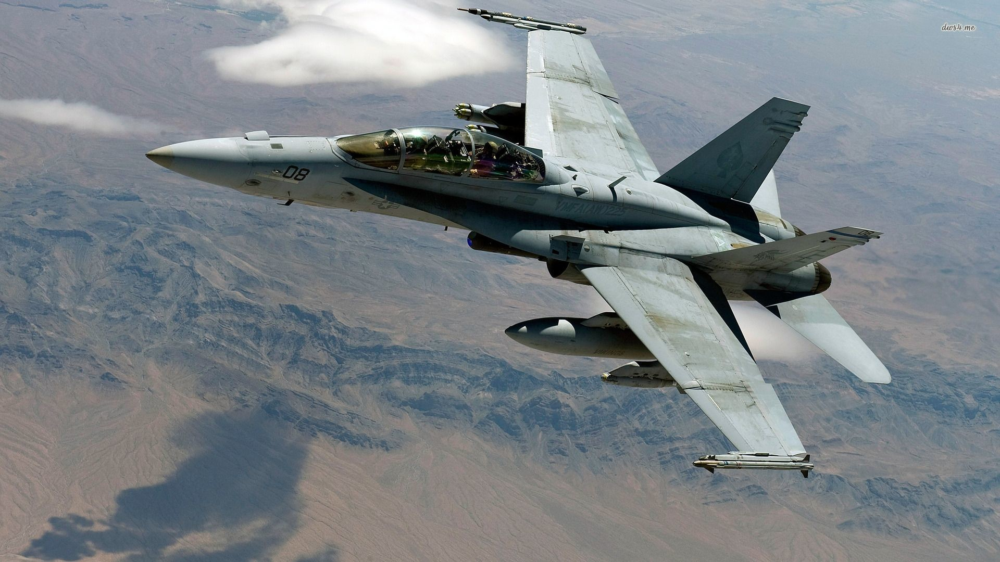

In [6]:
img

In [7]:
img = PILImage.create('c17.jpg')

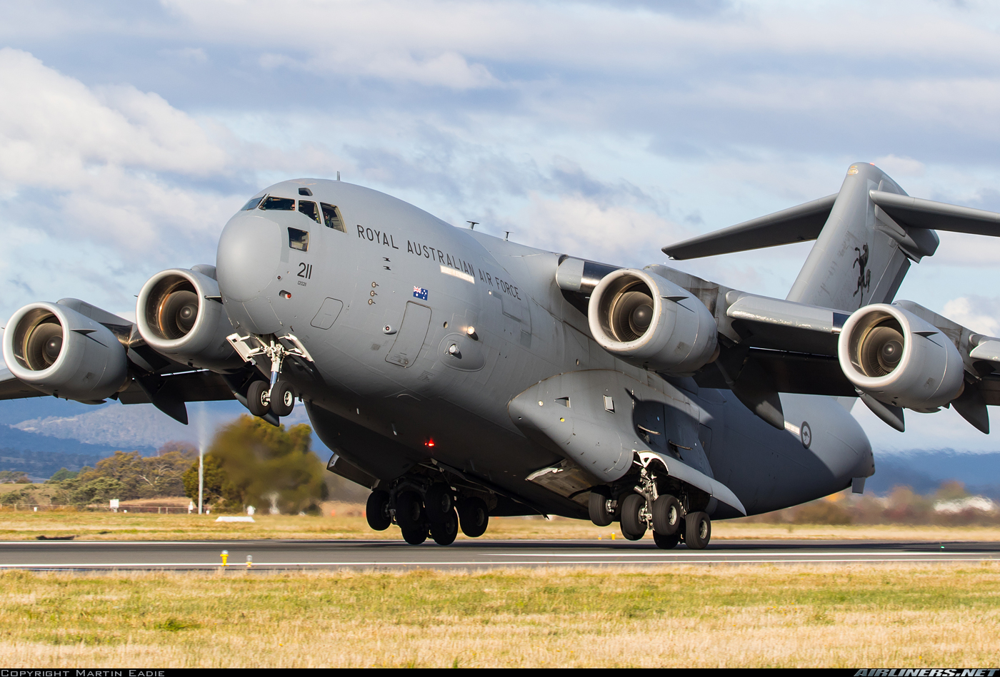

In [8]:
img

In [9]:
is_plane,_,probs = learn.predict(img)
print(f"This is a: {is_plane}.")
print(f"Probability : {probs[0]:.4f}")

This is a: C17.
Probability : 0.0015


In [10]:
img = PILImage.create('c5.jpg')

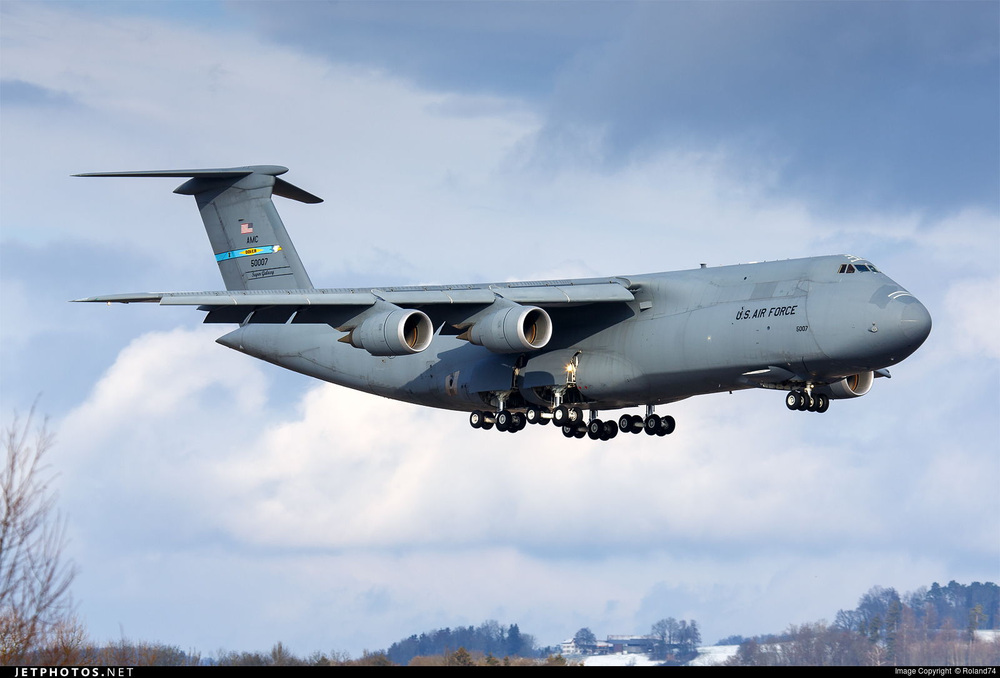

In [11]:
img

In [12]:
is_plane,_,probs = learn.predict(img)
print(f"This is a: {is_plane}.")
print(f"Probability : {probs[0]:.4f}")

This is a: C2.
Probability : 0.0000


In [13]:
?learn

Signature:      learn(event_name)
Type:           Learner
String form:    <fastai.learner.Learner object at 0x76cd3d752d80>
File:           ~/.cache/pypoetry/virtualenvs/military-detection-3ZlVuL9_-py3.12/lib/python3.12/site-packages/fastai/learner.py
Docstring:      Group together a `model`, some `dls` and a `loss_func` to handle training
Call docstring: Call `event_name` for all `Callback`s in `self.cbs`

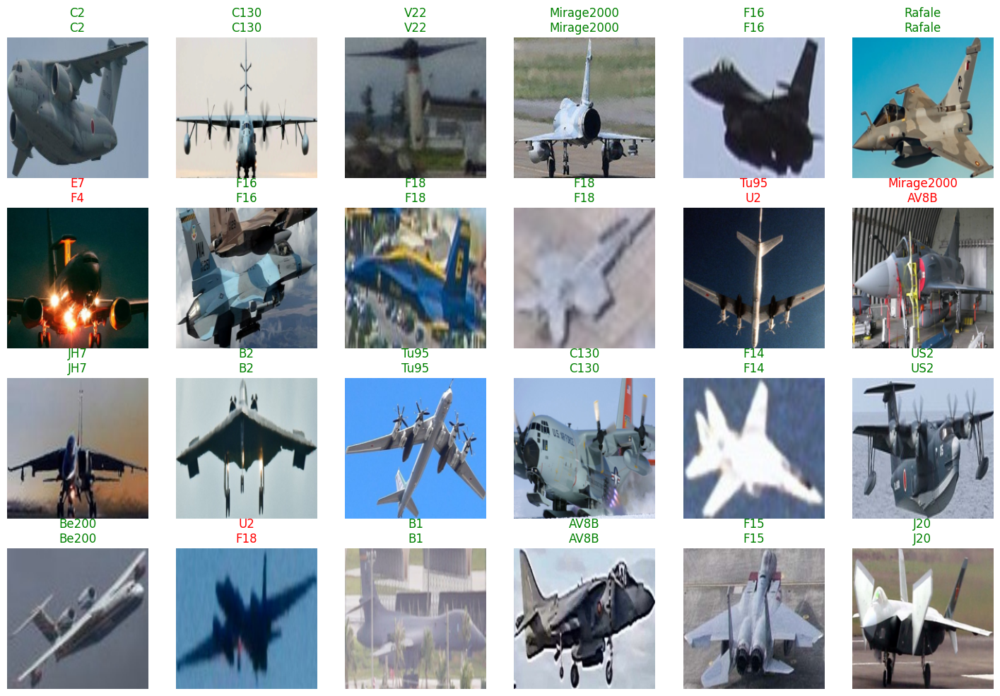

In [14]:
learn.show_results(max_n=24)

In [15]:
learn.dls.vocab

['A10', 'A400M', 'AG600', 'AH64', 'AV8B', 'An124', 'An22', 'An225', 'An72', 'B1', 'B2', 'B21', 'B52', 'Be200', 'C130', 'C17', 'C2', 'C390', 'C5', 'CH47', 'CL415', 'E2', 'E7', 'EF2000', 'F117', 'F14', 'F15', 'F16', 'F18', 'F22', 'F35', 'F4', 'H6', 'J10', 'J20', 'JAS39', 'JF17', 'JH7', 'KC135', 'KF21', 'KJ600', 'Ka27', 'Ka52', 'MQ9', 'Mi24', 'Mi28', 'Mig29', 'Mig31', 'Mirage2000', 'P3', 'RQ4', 'Rafale', 'SR71', 'Su24', 'Su25', 'Su34', 'Su57', 'TB001', 'TB2', 'Tornado', 'Tu160', 'Tu22M', 'Tu95', 'U2', 'UH60', 'US2', 'V22', 'Vulcan', 'WZ7', 'XB70', 'Y20', 'YF23', 'Z19']